# Audio Compression

In [1]:
import io
import os
import torch
import torchaudio
import matplotlib.pyplot as plt
from PIL import Image
from datasets import load_dataset
from einops import rearrange
from IPython.display import Audio
from walloc import walloc
class Config: pass

### Load the model from a pre-trained checkpoint

```wget https://hf.co/danjacobellis/walloc/resolve/main/Stereo_Li_108c_test2.pth```

In [2]:
checkpoint = torch.load("Stereo_Li_108c_test2.pth",map_location="cpu",weights_only=False)
codec_config = checkpoint['config']
codec = walloc.Codec1D(
    channels = codec_config.channels,
    J = codec_config.J,
    Ne = codec_config.Ne,
    Nd = codec_config.Nd,
    latent_dim = codec_config.latent_dim,
    latent_bits = codec_config.latent_bits,
    lightweight_encode = codec_config.lightweight_encode,
    post_filter = codec_config.post_filter
)
codec.load_state_dict(checkpoint['model_state_dict'])
codec.eval();

/home/dan/g/lib/python3.12/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


### Load example audio track

In [3]:
MUSDB = load_dataset("danjacobellis/musdb_segments_val",split='validation')
audio_buff = io.BytesIO(MUSDB[40]['audio_mix']['bytes'])
x, fs = torchaudio.load(audio_buff,normalize=False)
x = x.to(torch.float)
x = x - x.mean()
max_abs = x.abs().max()
x = x / (max_abs + 1e-8)
x = x/2

### Full encoding and decoding pipeline with .forward()

* If `codec.eval()` is called, the latent is rounded to nearest integer.

* If `codec.train()` is called, uniform noise is added instead of rounding.

In [4]:
with torch.no_grad():
    codec.eval()
    x_hat, _, _ = codec(x.unsqueeze(0))
Audio(x_hat[0],rate=44100)

### Accessing latents

In [5]:
with torch.no_grad():
    X = codec.wavelet_analysis(x.unsqueeze(0),J=codec.J)
    z = codec.encoder[0:2](X)
    z_hat = codec.encoder[2](z)
    X_hat = codec.decoder(z_hat)
    x_rec = codec.wavelet_synthesis(X_hat,J=codec.J)
print(f"dimensionality reduction: {x.numel()/z.numel():.4g}×")

dimensionality reduction: 4.74×


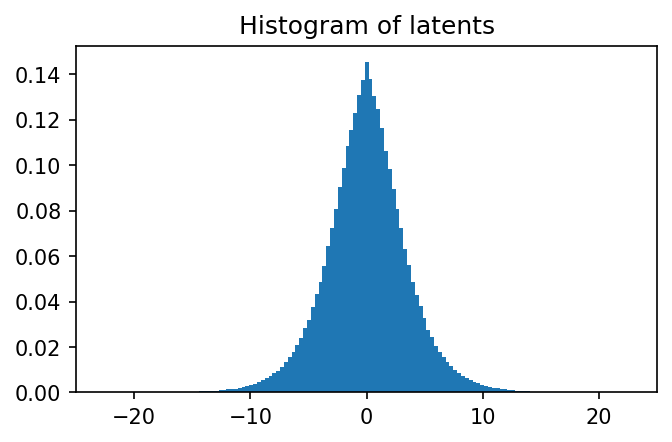

In [6]:
plt.figure(figsize=(5,3),dpi=150)
plt.hist(
    z.flatten().numpy(),
    range=(-25,25),
    bins=151,
    density=True,
);
plt.title("Histogram of latents")
plt.xlim([-25,25]);

# Lossless compression of latents

In [7]:
def pad(audio, p=2**16):
    B,C,L = audio.shape
    padding_size = (p - (L % p)) % p
    if padding_size > 0:
        audio = torch.nn.functional.pad(audio, (0, padding_size), mode='constant', value=0)
    return audio
with torch.no_grad():
    L = x.shape[-1]
    x_padded = pad(x.unsqueeze(0), 2**16)
    X = codec.wavelet_analysis(x_padded,codec.J)
    z = codec.encoder(X)
    ℓ = z.shape[-1]
    z = pad(z,128)
    z = rearrange(z, 'b c (w h) -> b c w h', h=128).to("cpu")
    webp = walloc.latent_to_pil(z,codec.latent_bits,3)[0]
    buff = io.BytesIO()
    webp.save(buff, format='WEBP', lossless=True)
    webp_bytes = buff.getbuffer()

compression_ratio:  9.83650170496386


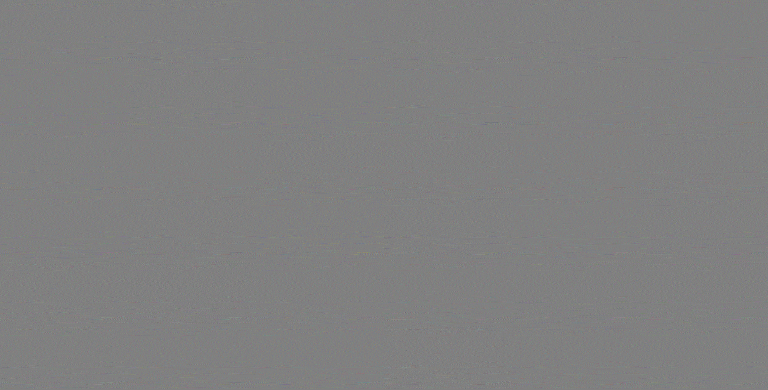

In [8]:
print("compression_ratio: ", x.numel()/len(webp_bytes))
webp

# Decoding

In [9]:
with torch.no_grad():
    z_hat = walloc.pil_to_latent(
        [Image.open(buff)],
        codec.latent_dim,
        codec.latent_bits,
        3)
    X_hat = codec.decoder(rearrange(z_hat, 'b c h w -> b c (h w)')[:,:,:ℓ])
    x_hat = codec.wavelet_synthesis(X_hat,codec.J)
    x_hat = codec.post(x_hat)
    x_hat = codec.clamp(x_hat[0,:,:L])

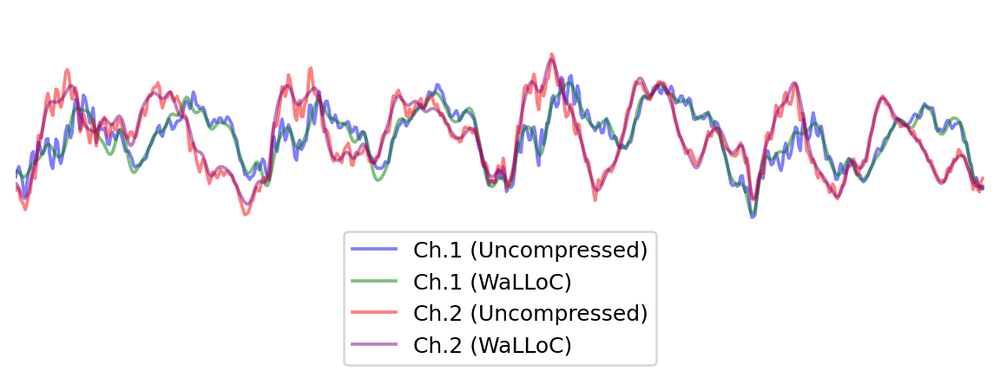

In [10]:
start, end = 0, 1000
plt.figure(figsize=(8, 3), dpi=180)
plt.plot(x[0, start:end], alpha=0.5, c='b', label='Ch.1 (Uncompressed)')
plt.plot(x_hat[0, start:end], alpha=0.5, c='g', label='Ch.1 (WaLLoC)')
plt.plot(x[1, start:end], alpha=0.5, c='r', label='Ch.2 (Uncompressed)')
plt.plot(x_hat[1, start:end], alpha=0.5, c='purple', label='Ch.2 (WaLLoC)')

plt.xlim([400,1000])
plt.ylim([-0.6,0.3])
plt.legend(loc='lower center')
plt.box(False)
plt.xticks([])
plt.yticks([]);